# Bladder Cancer

## Data processing

In [17]:
import numpy as np 
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

import shap
import lime
import json
from lime.lime_tabular import LimeTabularExplainer


# data load
df_BCa = pd.read_csv('BCa_raw.csv') # 암 원본 데이터 중 diagnosis 탭 data
df_BCa['Age'].fillna(df_BCa['Age'].mean(), inplace=True)


In [18]:
# 독립변수와 종속변수 정의

X_nn2h = df_BCa[['CK8','CK18','PD-1','PD-L1','Gender','Age']]

# diagnosis의 Y값 ('Decision')
Y = df_BCa['Decision']

# Column name의 list
col_name_nn2h = ['CK8','CK18','PD-1','PD-L1','Gender','Age']

# 독립변수(X) DataFrame 리스트
X_sets = [X_nn2h]

# 각 X 데이터셋의 이름
X_dataset_names = ['X_nn2h']

# 종속변수(y) Series 리스트
Y_sets = [Y]

# Col name 리스트
col_name_sets = [col_name_nn2h]

sets_name = ['nn2h']

num_sets = len(X_sets)

In [19]:
# from sklearn.preprocessing import StandardScaler


# # 스케일링된 데이터셋을 저장할 새로운 리스트
# X_ss_sets = []

# for i in range(num_sets):
#     # 'Gender' column이 있는지 확인
#     if 'Gender' in X_sets[i].columns:
#         # Gender column 분리
#         gender_column = X_sets[i]['Gender']
        
#         # Gender column 제거한 나머지 column들에 대해 스케일링 진행
#         X_without_gender = X_sets[i].drop('Gender', axis=1)
        
#         scaler = StandardScaler()
#         X_standard_values = scaler.fit_transform(X_without_gender)
        
#         # 스케일링된 DataFrame 생성 
#         X_standard_df = pd.DataFrame(X_standard_values, columns=X_without_gender.columns)
        
#         # Gender column 다시 추가
#         X_standard_df['Gender'] = gender_column.values
        
#     else:
#         # 'Gender' 열이 없는 경우, 모든 열에 대해 스케일링 진행
#         scaler = StandardScaler()
#         X_standard_values = scaler.fit_transform(X_sets[i])
         
#         # 스케일링된 DataFrame 생성 
#         X_standard_df = pd.DataFrame(X_standard_values, columns=X_sets[i].columns)

#     X_ss_sets.append(X_standard_df)

#     print(f"Preprocessing completed for {X_dataset_names[i]}")


In [20]:
from sklearn.preprocessing import MinMaxScaler

# 스케일링된 데이터셋을 저장할 새로운 리스트
X_norm_sets = []

for i in range(num_sets):
    # 'Gender' column이 있는지 확인
    if 'Gender' in X_sets[i].columns:
        # Gender column 분리
        gender_column = X_sets[i]['Gender']
        
        # Gender column 제거한 나머지 column들에 대해 스케일링 진행
        X_without_gender = X_sets[i].drop('Gender', axis=1)
        
        scaler = MinMaxScaler()
        X_normalized_values = scaler.fit_transform(X_without_gender)
        
        # 스케일링된 DataFrame 생성 
        X_normalized_df = pd.DataFrame(X_normalized_values, columns=X_without_gender.columns)
        
        # Gender column 다시 추가
        X_normalized_df['Gender'] = gender_column.values
        
    else:
        # 'Gender' 열이 없는 경우, 모든 열에 대해 스케일링 진행
        scaler = MinMaxScaler()
        X_normalized_values = scaler.fit_transform(X_sets[i])
        # 스케일링된 DataFrame 생성 
        X_normalized_df = pd.DataFrame(X_normalized_values, columns=X_sets[i].columns)

    X_norm_sets.append(X_normalized_df)

    print(f"Preprocessing completed for {X_dataset_names[i]}")


Preprocessing completed for X_nn2h


## Model.fit & predict

### 5) Neural Network

In [21]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout,BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [22]:
# 교차 검증(StratifiedKFold cross-validation) 설정
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=2)


# 결과 저장용 dictionary 초기화
results_nn2h = {}

# proba_result_nn2h
proba_nn2h = []

# Thresholds 설정 (0.1부터 0.7까지 0.05 간격으로 sweep)
thresholds = np.arange(0.1, 0.7, 0.05)

# ROC curve와 AUC 계산을 위한 빈 리스트 생성
roc_auc_list_nn2h = [[[0]*len(thresholds) for a in range(skf.get_n_splits())] for b in range(num_sets)]
fpr_list_nn2h = [[[0]*len(thresholds) for a in range(skf.get_n_splits())] for b in range(num_sets)]
tpr_list_nn2h = [[[0]*len(thresholds) for a in range(skf.get_n_splits())] for b in range(num_sets)]

best_threshold = 0.5


for i in range(num_sets):
    cm_total_nn2h = [0]*len(thresholds)
    acc_total_nn2h = [0]*len(thresholds)
    prec_total_nn2h = [0]*len(thresholds)
    rec_total_nn2h = [0]*len(thresholds)
    f1_total_nn2h = [0]*len(thresholds)
    auc_total_nn2h = [0]*len(thresholds)
    
    for num in range(len(thresholds)):
        cm_total_nn2h.append(np.zeros((2,2)))
    
    for j, (train_index, test_index) in enumerate(skf.split(X_norm_sets[i], Y_sets[i])):
        # 모델 구조 설정 (각 반복마다 새로운 모델 생성)
        model = Sequential()
        model.add(Dense(1024, input_dim=X_norm_sets[i].shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
        model.add(BatchNormalization())
        model.add(Dense(64,activation='relu'))
        model.add(Dense(1, activation='sigmoid'))

        # 모델 컴파일
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

        X_train_val, X_test_val = X_norm_sets[i].iloc[train_index], X_norm_sets[i].iloc[test_index]
        y_train_val, y_test_val= Y_sets[i].iloc[train_index], Y_sets[i].iloc[test_index]

        validation_ratio=0.2
        X_train,X_val,y_train,y_val=train_test_split(X_train_val,y_train_val,test_size=validation_ratio,stratify=y_train_val)

        early_stopping_callback=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20)
        checkpointer=tf.keras.callbacks.ModelCheckpoint(filepath=f"./nn2h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5",monitor='val_loss',verbose=0,save_best_only=True)
        history=model.fit(x=X_train,y=y_train,validation_data=(X_val,y_val),epochs=200,batch_size=32,callbacks=[early_stopping_callback,checkpointer],verbose=2)
        model.load_weights(f"./nn2h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5")   # 최적 모델 불러오기
        predictions_proba=model.predict(X_test_val).flatten()   # 예측 확률 생성
        fold_results = list(zip(test_index,predictions_proba))
        proba_nn2h.append(fold_results)
        predictions_xai = (predictions_proba > best_threshold).astype(int)
        
        # 예측과 실제값이 다른 index 추출
        misclassified_indices = np.where(predictions_xai != y_test_val)[0]
        misclassified_indices_test = test_index[predictions_xai != y_test_val]
        print('잘못 예측한 index 번호 list',misclassified_indices_test)
        
        def predict_proba(data):
            proba=model.predict(data)
            return np.hstack([1-proba,proba])
        
        for index, index_test in zip(misclassified_indices, misclassified_indices_test):
            if i==0:
                print(f"SHAP Force Plot for misclassified data point {index_test} in set {i+1}:")
                print('index #',index_test,'의 실제 정답은',Y_sets[0][index_test],'예측 결과는',predictions_proba[index])
            
                # SHAP force plot 그리기
                explainer_nn2h = shap.GradientExplainer(model,X_norm_sets[0].values)
                shap_values_nn2h = explainer_nn2h.shap_values(X_norm_sets[0].values)
                shap.initjs()
                
                expected_value = model.predict(X_norm_sets[0]).mean()
                # plt.figure()
                # Save SHAP force plot as an image file
                shap.force_plot(expected_value, shap_values_nn2h[0][index_test,:], X_norm_sets[0].iloc[index_test], show=False,matplotlib=True).savefig(f"nn2h_shap_plots/SHAP Force Plot for misclassified data point {index_test}.png")
                plt.close()

                # LIME table 그리기
                lime_explainer_nn2h = LimeTabularExplainer(X_norm_sets[0].to_numpy(), feature_names=X_norm_sets[0].columns.tolist(), class_names=['Not Decision', 'Decision'], verbose=True)
                lime_exp_nn2h = lime_explainer_nn2h.explain_instance(X_norm_sets[0].iloc[index_test], predict_proba)
                # lime_exp_1_nn2h.show_in_notebook()
                # Save LIME table as an image file
                lime_exp_nn2h.save_to_file(f"nn2h_lime_plots/LIME table for misclassified data point {index_test}.html")
        
        for idx, threshold in enumerate(thresholds):
            predictions=(predictions_proba>threshold).astype(int)   # 확률을 이진 레이블로 변환
            # roc_curve 함수로 FPR (False Positive Rate)과 TPR (True Positive Rate) 계산
            fpr, tpr, thre = roc_curve(y_test_val.values.astype(int), predictions_proba)
            # AUC 계산
            roc_auc = roc_auc_score(y_test_val.values.astype(int), predictions_proba)
            fpr_list_nn2h[i][j] = fpr
            tpr_list_nn2h[i][j] = tpr
            roc_auc_list_nn2h[i][j][idx] = roc_auc
            cm_total_nn2h[idx]+=confusion_matrix(y_test_val.values.astype(int),predictions)
            acc_total_nn2h[idx]+=accuracy_score(y_test_val.values.astype(int),predictions)
            prec_total_nn2h[idx]+=precision_score(y_test_val.values.astype(int),predictions)
            rec_total_nn2h[idx]+=recall_score(y_test_val.values.astype(int),predictions)
            f1_total_nn2h[idx]+=f1_score(y_test_val.values.astype(int), predictions)
            auc_total_nn2h[idx]+=roc_auc_score(y_test_val.values.astype(int), predictions_proba)

    if f"Model {i+1}" not in results_nn2h:
            results_nn2h[f"Model {i+1}"]={}
    
    for idx, threshold in enumerate(thresholds):
        results_nn2h[f"Model {i+1}"][threshold]={
            "Confusion Matrix": cm_total_nn2h[idx],
            "Accuracy": acc_total_nn2h[idx] / skf.get_n_splits(),
            "Precision": prec_total_nn2h[idx] / skf.get_n_splits(),
            "Recall": rec_total_nn2h[idx] / skf.get_n_splits(),
            "F1-Score": f1_total_nn2h[idx] / skf.get_n_splits(),
            "AUC": auc_total_nn2h[idx] / skf.get_n_splits()}

# Predict_proba값 index 순서대로 정렬 후 저장          
sorted_result_nn2h = [0]
df_proba_nn2h = [0]
proba_nn2h = np.concatenate(proba_nn2h)
sorted_result_nn2h = proba_nn2h[proba_nn2h[:, 0].argsort()]
df_proba_nn2h = pd.DataFrame(sorted_result_nn2h[:,1], columns=['Predictor value'])
    
# csv로 저장
df_proba_nn2h.to_csv('Predictor value nn2h.csv', index=False)


Epoch 1/200
2/2 - 1s - loss: 0.5900 - accuracy: 0.6923 - val_loss: 0.6433 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.5188 - accuracy: 0.7308 - val_loss: 0.6340 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.3876 - accuracy: 0.8462 - val_loss: 0.6339 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.3515 - accuracy: 0.8269 - val_loss: 0.6290 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.3469 - accuracy: 0.8654 - val_loss: 0.6206 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.2935 - accuracy: 0.9038 - val_loss: 0.6128 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.3087 - accuracy: 0.8462 - val_loss: 0.6086 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.3014 - accuracy: 0.8846 - val_loss: 0.6073 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.2824 - accuracy: 0.8846 - val_loss: 0.6090 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.2526 - accuracy: 0.8846 - val_loss: 0.6125 - val_accuracy: 0.6429
Epoch 11/200
2/2 - 0s - loss:

Intercept 0.7057942892044275
Prediction_local [0.48464695]
Right: 0.49207622
SHAP Force Plot for misclassified data point 63 in set 1:
index # 63 의 실제 정답은 0 예측 결과는 0.5119536


Intercept 0.5824978485724132
Prediction_local [0.60466109]
Right: 0.5119536
SHAP Force Plot for misclassified data point 67 in set 1:
index # 67 의 실제 정답은 0 예측 결과는 0.6928985


Intercept 0.550600548281517
Prediction_local [0.70004815]
Right: 0.6928985
SHAP Force Plot for misclassified data point 70 in set 1:
index # 70 의 실제 정답은 0 예측 결과는 0.512162


Intercept 0.5747674423121428
Prediction_local [0.62362134]
Right: 0.512162
SHAP Force Plot for misclassified data point 78 in set 1:
index # 78 의 실제 정답은 0 예측 결과는 0.678418


Intercept 0.550753182591476
Prediction_local [0.691928]
Right: 0.678418
Epoch 1/200
2/2 - 1s - loss: 0.6256 - accuracy: 0.6154 - val_loss: 0.6629 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.4814 - accuracy: 0.8077 - val_loss: 0.6532 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.4428 - accuracy: 0.8462 - val_loss: 0.6445 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.3830 - accuracy: 0.8077 - val_loss: 0.6377 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.3529 - accuracy: 0.8269 - val_loss: 0.6329 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.3467 - accuracy: 0.8269 - val_loss: 0.6294 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.3082 - accuracy: 0.8654 - val_loss: 0.6272 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.2975 - accuracy: 0.8462 - val_loss: 0.6248 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.2835 - accuracy: 0.8846 - val_loss: 0.6224 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.2877 - accuracy: 0.8846

Intercept 0.5434959243597415
Prediction_local [0.30914096]
Right: 0.08681849
SHAP Force Plot for misclassified data point 46 in set 1:
index # 46 의 실제 정답은 1 예측 결과는 0.37379545


Intercept 0.463950944151062
Prediction_local [0.55342262]
Right: 0.37379545
SHAP Force Plot for misclassified data point 51 in set 1:
index # 51 의 실제 정답은 1 예측 결과는 0.14558867


Intercept 0.6789219815976568
Prediction_local [0.38219944]
Right: 0.14558867
SHAP Force Plot for misclassified data point 57 in set 1:
index # 57 의 실제 정답은 0 예측 결과는 0.59639525


Intercept 0.7159633453617407
Prediction_local [0.25636719]
Right: 0.59639525
SHAP Force Plot for misclassified data point 72 in set 1:
index # 72 의 실제 정답은 0 예측 결과는 0.7958816


Intercept 0.46088867283133206
Prediction_local [0.53814143]
Right: 0.7958816
SHAP Force Plot for misclassified data point 82 in set 1:
index # 82 의 실제 정답은 0 예측 결과는 0.9208441


Intercept 0.4093897716976388
Prediction_local [0.67921098]
Right: 0.9208441
Epoch 1/200
2/2 - 1s - loss: 0.7877 - accuracy: 0.5000 - val_loss: 0.6639 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.4549 - accuracy: 0.8077 - val_loss: 0.6470 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.3859 - accuracy: 0.8462 - val_loss: 0.6387 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.3686 - accuracy: 0.8077 - val_loss: 0.6337 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.3544 - accuracy: 0.8269 - val_loss: 0.6308 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.3053 - accuracy: 0.8269 - val_loss: 0.6289 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.4045 - accuracy: 0.8077 - val_loss: 0.6297 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.2539 - accuracy: 0.8846 - val_loss: 0.6300 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.3134 - accuracy: 0.8077 - val_loss: 0.6283 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.2620 - accuracy: 0.

Intercept 0.7929987370166299
Prediction_local [0.41754147]
Right: 0.36980897
SHAP Force Plot for misclassified data point 48 in set 1:
index # 48 의 실제 정답은 1 예측 결과는 0.40085799


Intercept 0.7720258642366101
Prediction_local [0.47315228]
Right: 0.40085799
SHAP Force Plot for misclassified data point 55 in set 1:
index # 55 의 실제 정답은 0 예측 결과는 0.5595908


Intercept 0.753627911586886
Prediction_local [0.53543177]
Right: 0.5595908
SHAP Force Plot for misclassified data point 65 in set 1:
index # 65 의 실제 정답은 0 예측 결과는 0.609917


Intercept 0.6151866565924553
Prediction_local [0.65008908]
Right: 0.609917
SHAP Force Plot for misclassified data point 66 in set 1:
index # 66 의 실제 정답은 0 예측 결과는 0.55837643


Intercept 0.6178882085875911
Prediction_local [0.63156836]
Right: 0.55837643
SHAP Force Plot for misclassified data point 73 in set 1:
index # 73 의 실제 정답은 0 예측 결과는 0.6071487


Intercept 0.604243316610474
Prediction_local [0.6897488]
Right: 0.6071487
Epoch 1/200
2/2 - 1s - loss: 0.7509 - accuracy: 0.4528 - val_loss: 0.6720 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.4663 - accuracy: 0.7547 - val_loss: 0.6613 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.4305 - accuracy: 0.7736 - val_loss: 0.6554 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.3849 - accuracy: 0.8113 - val_loss: 0.6526 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.3633 - accuracy: 0.8113 - val_loss: 0.6505 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.3565 - accuracy: 0.8302 - val_loss: 0.6481 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.3544 - accuracy: 0.8302 - val_loss: 0.6459 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.3119 - accuracy: 0.8302 - val_loss: 0.6439 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.3197 - accuracy: 0.8868 - val_loss: 0.6427 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.2996 - accuracy: 0.88

Intercept 0.5694570824946857
Prediction_local [0.68426224]
Right: 0.68979836
SHAP Force Plot for misclassified data point 64 in set 1:
index # 64 의 실제 정답은 0 예측 결과는 0.66806674


Intercept 0.5694809990033073
Prediction_local [0.68351049]
Right: 0.66806674
SHAP Force Plot for misclassified data point 71 in set 1:
index # 71 의 실제 정답은 0 예측 결과는 0.5057575


Intercept 0.7315108938508766
Prediction_local [0.54851339]
Right: 0.5057575
SHAP Force Plot for misclassified data point 79 in set 1:
index # 79 의 실제 정답은 0 예측 결과는 0.6321908


Intercept 0.718267890260503
Prediction_local [0.58236653]
Right: 0.6321908
Epoch 1/200
2/2 - 1s - loss: 0.6629 - accuracy: 0.4528 - val_loss: 0.6565 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.4966 - accuracy: 0.7736 - val_loss: 0.6456 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.4610 - accuracy: 0.8302 - val_loss: 0.6395 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.3758 - accuracy: 0.8302 - val_loss: 0.6371 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.3725 - accuracy: 0.8491 - val_loss: 0.6362 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.4056 - accuracy: 0.7925 - val_loss: 0.6350 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.3267 - accuracy: 0.8302 - val_loss: 0.6329 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.2894 - accuracy: 0.8868 - val_loss: 0.6296 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.2824 - accuracy: 0.8679 - val_loss: 0.6268 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.2908 - accuracy: 0.8

Intercept 0.598450798372331
Prediction_local [0.56917663]
Right: 0.4204307
SHAP Force Plot for misclassified data point 44 in set 1:
index # 44 의 실제 정답은 1 예측 결과는 0.49827617


Intercept 0.6394298496679399
Prediction_local [0.43861426]
Right: 0.49827617
SHAP Force Plot for misclassified data point 56 in set 1:
index # 56 의 실제 정답은 0 예측 결과는 0.5194634


Intercept 0.7139992316281117
Prediction_local [0.47608875]
Right: 0.5194634
SHAP Force Plot for misclassified data point 69 in set 1:
index # 69 의 실제 정답은 0 예측 결과는 0.63989246


Intercept 0.5589155054604776
Prediction_local [0.62064924]
Right: 0.63989246
SHAP Force Plot for misclassified data point 80 in set 1:
index # 80 의 실제 정답은 0 예측 결과는 0.5164656


Intercept 0.6649185057273377
Prediction_local [0.61782174]
Right: 0.5164656


SHAP Summary Plot for set 1:


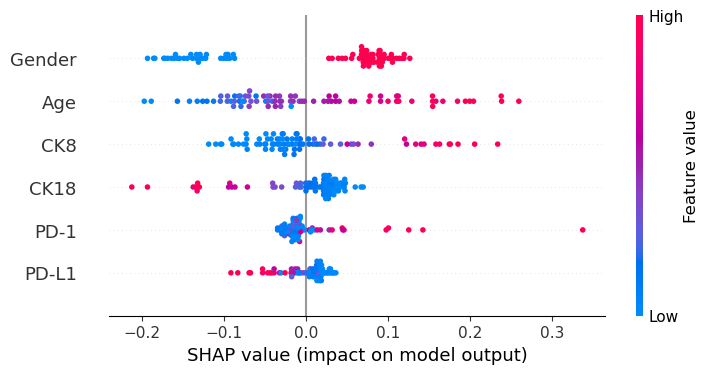

In [23]:
shap.initjs()

best_threshold_nn2h = 0.5

for i in range(num_sets):
    X = X_norm_sets[i]
    Y = Y_sets[i]

    # 해당 인덱스의 모델 선택
    model = Sequential()
    model.add(Dense(1024, input_dim=X.shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
    model.add(BatchNormalization())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    
    shap_values_nn2h_accumulator = np.zeros((X.shape[0], X.shape[1]))

    for j in range(5):
        model.load_weights(f"./nn2h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5")   # 최적 모델 불러오기
        model.compile(optimizer='adam', loss='binary_crossentropy')

        
        def predict_proba(data):
            proba=model.predict(data)
            return np.hstack([1-proba,proba])

        explainer_summary_nn2h = shap.GradientExplainer(model,X.values) 
        shap_values_summary_nn2h = explainer_summary_nn2h.shap_values(X.values)
        
        # Compute the expected value
        expected_value = model.predict(X).mean() 

        # Accumulate SHAP values
        shap_values_nn2h_accumulator += np.array(shap_values_summary_nn2h[0])

    # Average the accumulated SHAP values
    shap_values_nn2h_average = shap_values_nn2h_accumulator / 5.0

    print(f"SHAP Summary Plot for set {i+1}:")
    
    # Use the average SHAP values for the summary plot
    shap.summary_plot(shap_values_nn2h_average, X)

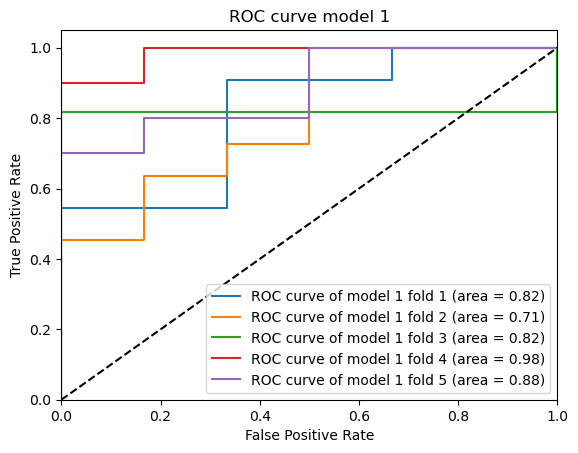

In [24]:
from sklearn.metrics import roc_curve, auc

i = 0  # 첫번째 모델 선택

# Fold 별로 반복
for j in range(skf.get_n_splits()):

    # 실제 레이블과 예측 확률을 기반으로 FPR, TPR 계산
    fpr = np.array(fpr_list_nn2h[i][j]).flatten()
    tpr = np.array(tpr_list_nn2h[i][j]).flatten()
    
    # AUC 계산
    roc_auc = auc(fpr, tpr)

    # ROC curve 그리기
    plt.plot(fpr, tpr, label=f'ROC curve of model {i+1} fold {j+1} (area = {roc_auc:0.2f})')
# 대각선 추가 (random classifier)
plt.plot([0, 1], [0, 1], 'k--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve model 1')
plt.legend(loc="lower right")

# Plot 표시
plt.show()


In [25]:
# 데이터프레임 생성을 위한 빈 리스트 초기화
data_metrics_nn2h = []

# results_nn2h 딕셔너리의 내용을 데이터프레임에 추가
for model, thresholds in results_nn2h.items():
    for threshold in thresholds:
        if threshold in thresholds:
            metrics = thresholds[threshold]
            accuracy = metrics['Accuracy']
            precision = metrics['Precision']
            recall = metrics['Recall']
            f1_score = metrics['F1-Score']
            auc = metrics['AUC']
        else:
            accuracy = None
            precision = None
            recall = None
            f1_score = None
            auc = None
            
        data_metrics_nn2h.append([model, threshold, accuracy, precision, recall, f1_score, auc])

# 데이터프레임 생성
df_metrics_nn2h = pd.DataFrame(data_metrics_nn2h, columns=['Model', 'Threshold', 'Accuracy', 'Precision', 'Recall', 'F1-Score','AUC'])

df_metrics_nn2h

,Model,Threshold,Accuracy,Precision,Recall,F1-Score,AUC
0,Model 1,0.10,0.626471,0.633824,0.981818,0.770126,0.84303
1,Model 1,0.15,0.614706,0.628824,0.963636,0.760440,0.84303
2,Model 1,0.20,0.626471,0.637395,0.963636,0.765978,0.84303
3,Model 1,0.25,0.626471,0.637395,0.963636,0.765978,0.84303
4,Model 1,0.30,0.638235,0.647285,0.963636,0.771978,0.84303
5,Model 1,0.35,0.650735,0.655618,0.963636,0.778132,0.84303
6,Model 1,0.40,0.663971,0.678712,0.927273,0.778505,0.84303
7,Model 1,0.45,0.663235,0.688328,0.889091,0.770080,0.84303
8,Model 1,0.50,0.687500,0.715085,0.850909,0.774502,0.84303
9,Model 1,0.55,0.748529,0.782207,0.850909,0.811702,0.84303


In [26]:
# 각 set 별 threshold 별 confusion matrix 출력
for i in range(num_sets):
    for idx, threshold in enumerate(thresholds):
        # Confusion Matrix 출력
        print(f"Set {sets_name[i]}, Threshold: {threshold}")
        print(results_nn2h[f"Model {i+1}"][threshold]["Confusion Matrix"])
        print()

# false negative들을 dictionary에 담기
false_negatives_nn2h = {}
for i in range(num_sets):
    for threshold in thresholds:
        if f"Model {i+1}" not in false_negatives_nn2h:
            false_negatives_nn2h[f"Model {i+1}"] = {}
        
        # False Negatives Rate 계산 및 저장
        cm = results_nn2h[f"Model {i+1}"][threshold]["Confusion Matrix"]
        false_negatives_rate = cm[1][0] / (cm[1][0] + cm[1][1])
        
        # False Negatives Rate를 dictionary에 저장
        false_negatives_rate_dict = {"False Negatives Rate": false_negatives_rate}
        false_negatives_nn2h[f"Model {i+1}"][threshold] = false_negatives_rate_dict

# 결과 확인하기
print(false_negatives_nn2h)


Set nn2h, Threshold: 0.1
[[ 0 30]
 [ 1 52]]

Set nn2h, Threshold: 0.15000000000000002
[[ 0 30]
 [ 2 51]]

Set nn2h, Threshold: 0.20000000000000004
[[ 1 29]
 [ 2 51]]

Set nn2h, Threshold: 0.25000000000000006
[[ 1 29]
 [ 2 51]]

Set nn2h, Threshold: 0.30000000000000004
[[ 2 28]
 [ 2 51]]

Set nn2h, Threshold: 0.3500000000000001
[[ 3 27]
 [ 2 51]]

Set nn2h, Threshold: 0.40000000000000013
[[ 6 24]
 [ 4 49]]

Set nn2h, Threshold: 0.45000000000000007
[[ 8 22]
 [ 6 47]]

Set nn2h, Threshold: 0.5000000000000001
[[12 18]
 [ 8 45]]

Set nn2h, Threshold: 0.5500000000000002
[[17 13]
 [ 8 45]]

Set nn2h, Threshold: 0.6000000000000002
[[20 10]
 [10 43]]

Set nn2h, Threshold: 0.6500000000000001
[[24  6]
 [13 40]]

{'Model 1': {0.1: {'False Negatives Rate': 0.018867924528301886}, 0.15000000000000002: {'False Negatives Rate': 0.03773584905660377}, 0.20000000000000004: {'False Negatives Rate': 0.03773584905660377}, 0.25000000000000006: {'False Negatives Rate': 0.03773584905660377}, 0.30000000000000004

In [27]:
# 데이터프레임 생성을 위한 빈 리스트 초기화
data_falsenegative_nn2h = []

# false_negatives_nn2h 딕셔너리의 내용을 데이터프레임에 추가
for model, thresholds in false_negatives_nn2h.items():
    for threshold, metrics in thresholds.items():
        false_neg_rate = metrics['False Negatives Rate']
        data_falsenegative_nn2h.append([model, threshold, false_neg_rate])

# 데이터프레임 생성
df_false_negatives_nn2h = pd.DataFrame(data_falsenegative_nn2h, columns=['Model', 'Threshold', 'False Negatives Rate'])

# 출력
df_false_negatives_nn2h

,Model,Threshold,False Negatives Rate
0,Model 1,0.10,0.018868
1,Model 1,0.15,0.037736
2,Model 1,0.20,0.037736
3,Model 1,0.25,0.037736
4,Model 1,0.30,0.037736
5,Model 1,0.35,0.037736
6,Model 1,0.40,0.075472
7,Model 1,0.45,0.113208
8,Model 1,0.50,0.150943
9,Model 1,0.55,0.150943


In [28]:
# df_false_negatives와 df_metrics_nn2h 합치기 (outer join)
df_combined_nn2h_relu_2h = pd.merge(df_false_negatives_nn2h, df_metrics_nn2h,on=["Model", "Threshold"],how="outer")

# 출력
df_combined_nn2h_relu_2h

,Model,Threshold,False Negatives Rate,Accuracy,Precision,Recall,F1-Score,AUC
0,Model 1,0.10,0.018868,0.626471,0.633824,0.981818,0.770126,0.84303
1,Model 1,0.15,0.037736,0.614706,0.628824,0.963636,0.760440,0.84303
2,Model 1,0.20,0.037736,0.626471,0.637395,0.963636,0.765978,0.84303
3,Model 1,0.25,0.037736,0.626471,0.637395,0.963636,0.765978,0.84303
4,Model 1,0.30,0.037736,0.638235,0.647285,0.963636,0.771978,0.84303
5,Model 1,0.35,0.037736,0.650735,0.655618,0.963636,0.778132,0.84303
6,Model 1,0.40,0.075472,0.663971,0.678712,0.927273,0.778505,0.84303
7,Model 1,0.45,0.113208,0.663235,0.688328,0.889091,0.770080,0.84303
8,Model 1,0.50,0.150943,0.687500,0.715085,0.850909,0.774502,0.84303
9,Model 1,0.55,0.150943,0.748529,0.782207,0.850909,0.811702,0.84303


In [29]:
# CSV 파일로 저장
df_combined_nn2h_relu_2h.to_csv('df_combined_nn2h_relu_2h.csv', index=False)


## XAI

In [30]:
# shap.initjs()

# best_threshold_nn2h=0.5

# for i in range(num_sets):
#     X = X_norm_sets[i]
#     Y = Y_sets[i]

#     # 해당 인덱스의 모델 선택
#     model = Sequential()
#     model.add(Dense(1024, input_dim=X.shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
#     model.add(BatchNormalization())
#     model.add(Dense(64, activation='relu'))
#     model.add(Dense(1, activation='sigmoid'))
    
#     shap_values_nn2h_accumulator = np.zeros((X.shape[0], X.shape[1]))

#     for j in range(5):
#         model.load_weights(f"./nn2h_model_relu_2h/{dataset_names[i]}_fold{j+1}.hdf5")   # 최적 모델 불러오기
#         model.compile(optimizer='adam', loss='binary_crossentropy')

        
#         def predict_proba(data):
#             proba=model.predict(data)
#             return np.hstack([1-proba,proba])

#         explainer_nn2h = shap.DeepExplainer(model,X.values) 
#         shap_values_nn2h = explainer_nn2h.shap_values(X.values)

#         # Accumulate SHAP values
#         shap_values_nn2h_accumulator += np.array(shap_values_nn2h[0])

#     # Average the accumulated SHAP values
#     shap_values_nn2h_average = shap_values_nn2h_accumulator / 5.0

#     print(f"SHAP Summary Plot for set {i+1}:")
    
#     # Use the average SHAP values for the summary plot
#     shap.summary_plot(shap_values_nn2h_average, X)

#     y_pred = (model.predict(X).flatten() > best_threshold_nn2h).astype(int)
#     misclassified_indices = np.where(Y != y_pred)[0]
#     print()
#     print('잘못 예측한 index 번호 list',misclassified_indices)

#     for index in misclassified_indices:
#         print(f"SHAP Force Plot for misclassified data point {index} in set {i+1}:")
#         print('index #',index,'의 실제 정답은',Y[index],'예측 결과는',y_pred[index])
#         display(shap.force_plot(explainer_nn2h.expected_value[0].numpy(), shap_values_nn2h[0][index,:], X.iloc[index]))
        
#         lime_explainer = LimeTabularExplainer(X.to_numpy(), feature_names=X.columns.tolist(), class_names=['Not Decision', 'Decision'], verbose=True)
#         lime_exp = lime_explainer.explain_instance(X.iloc[index].to_numpy(), predict_proba)
#         lime_exp.show_in_notebook(show_table=True)


In [31]:
# from pdpbox import pdp

# for i in range(num_sets):
#     model = Sequential()
#     model.add(Dense(1024, input_dim=X_sets[i].shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
#     model.add(BatchNormalization())
#     model.add(Dense(64,'relu'))
#     model.add(Dense(1, activation='sigmoid'))
    
#     print('-----------------------------------------------------------------------------------------')
#     print(X_dataset_names[i],'에 대한 PDPplot')
#     for j in range(5):
#         model.load_weights(f"./nn2h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5")
#         print('-----------------------------------------------------------------------------------------')
#         print(X_dataset_names[i],'의 fold',j+1,'에 대한 PDPplot')
        
#         for k in range(len(col_name_sets[i])):
#             pdp_goals = pdp.pdp_isolate(model=model, dataset=X_norm_sets[i], model_features=X_norm_sets[i].columns.tolist(),feature=col_name_sets[i][k])
        
#             # PDP 그리기
#             pdp.pdp_plot(pdp_goals, col_name_sets[i][k])
#             plt.show()

-----------------------------------------------------------------------------------------
X_nn2h 에 대한 PDPplot
-----------------------------------------------------------------------------------------
X_nn2h 의 fold 1 에 대한 PDPplot


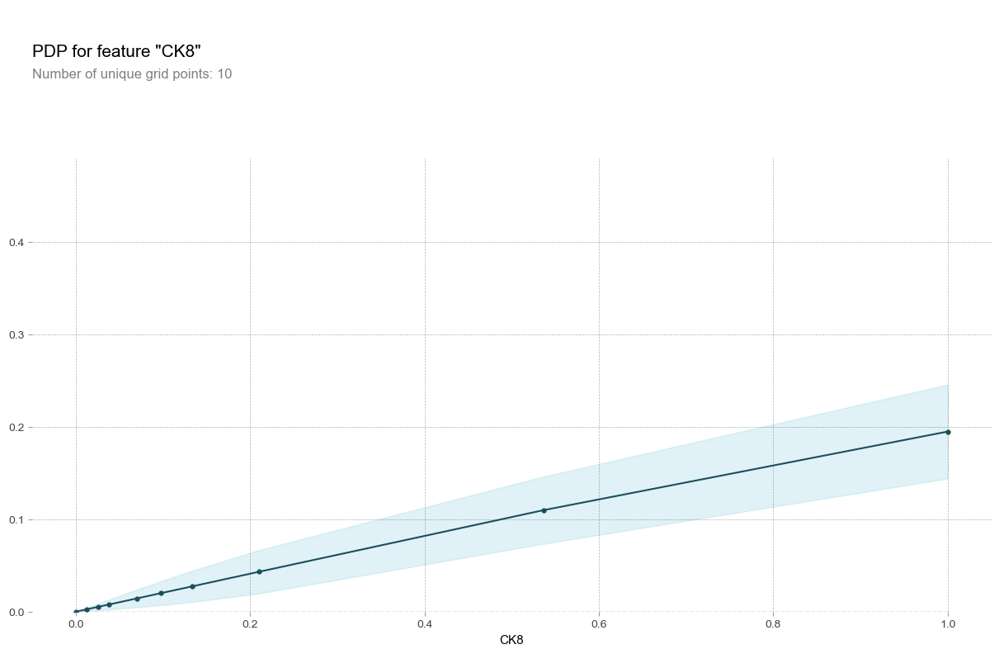

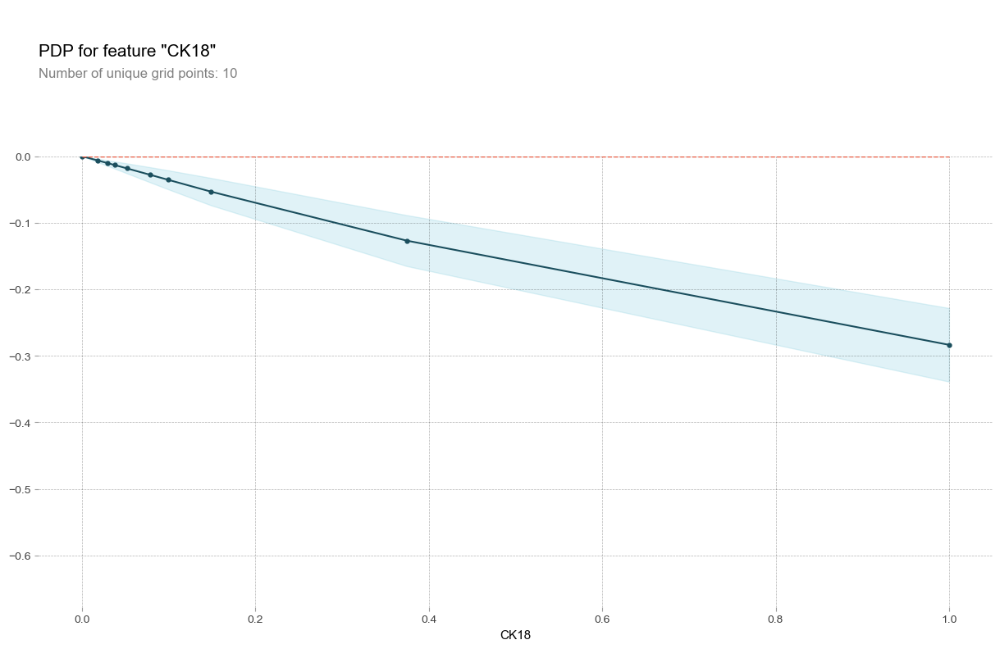

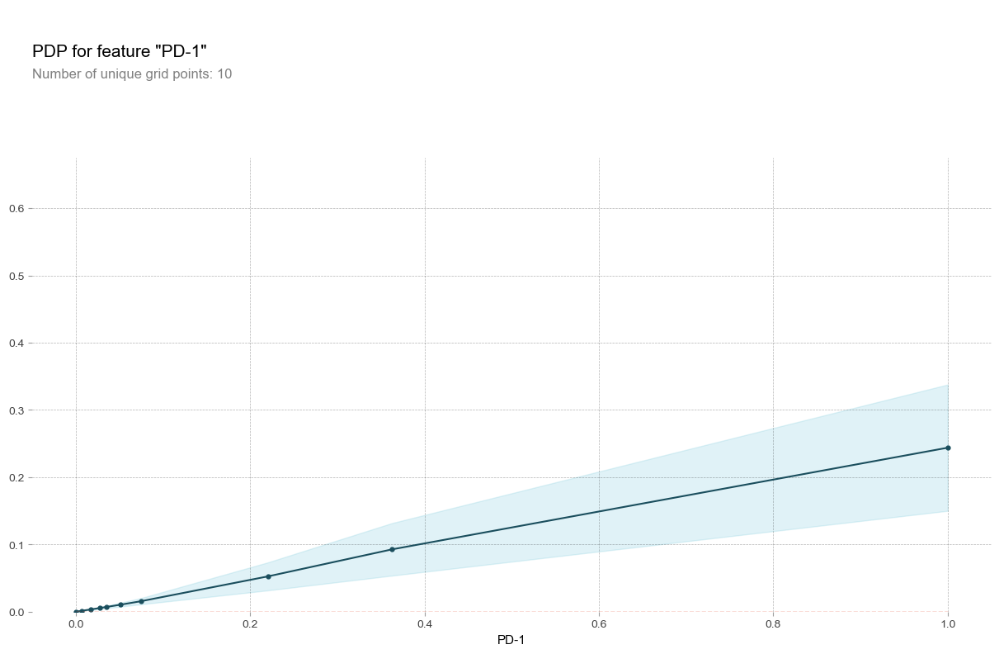

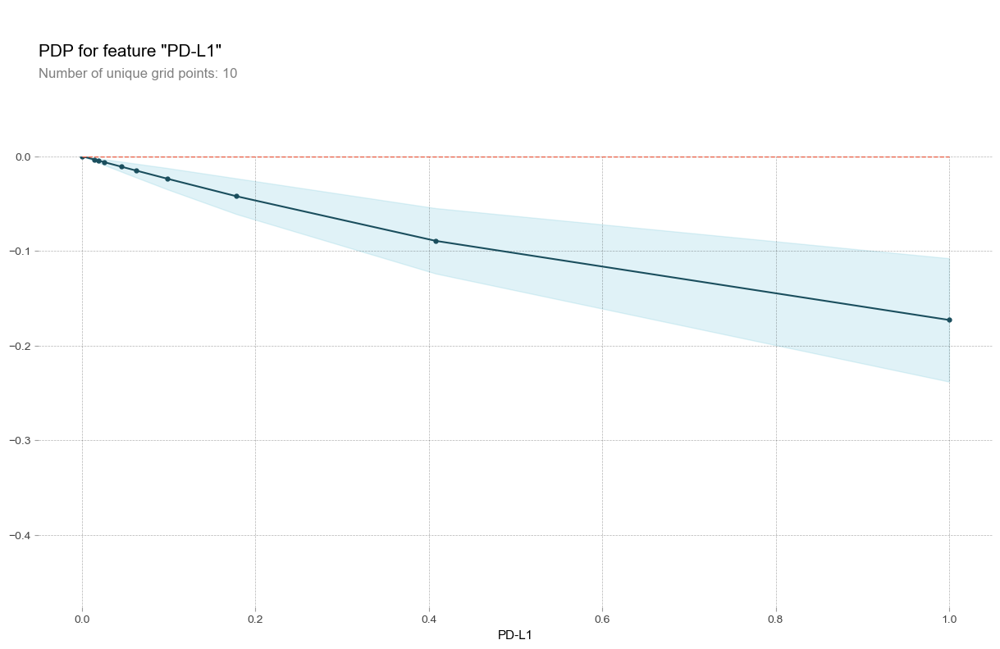

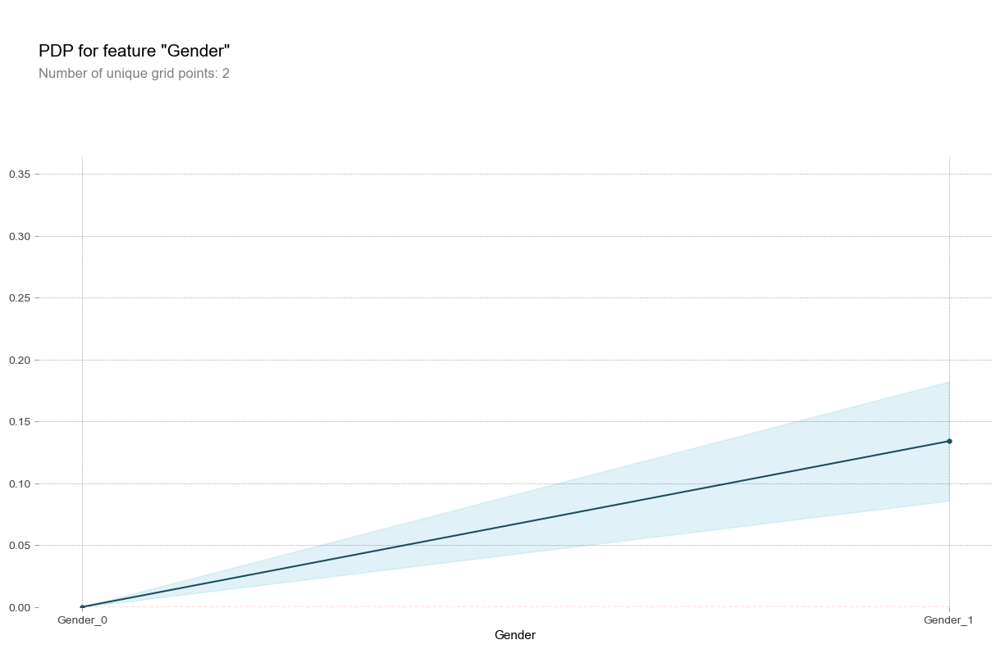

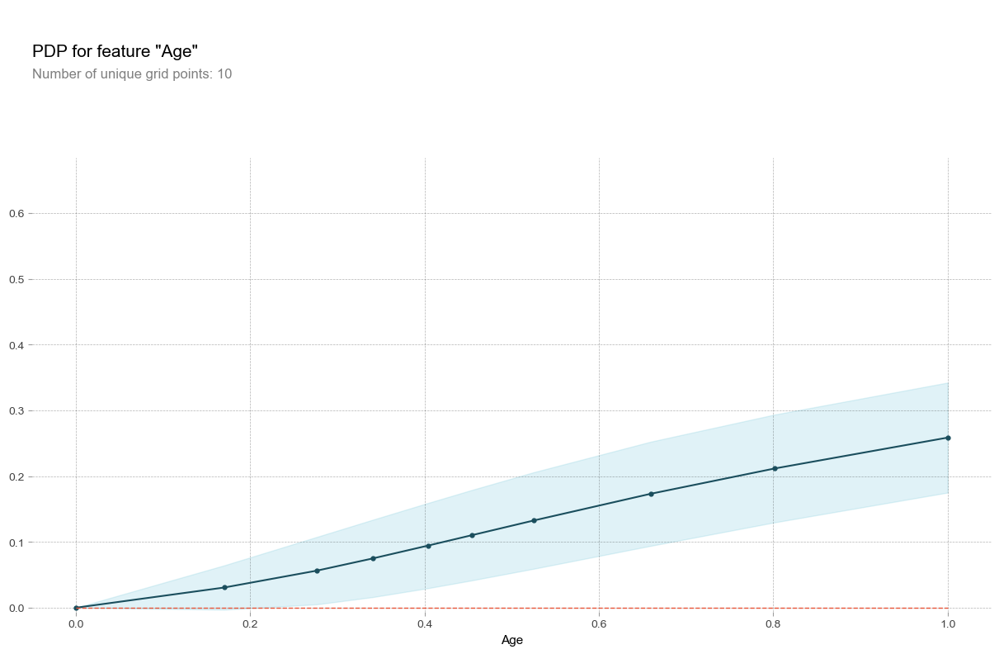

-----------------------------------------------------------------------------------------
X_nn2h 의 fold 2 에 대한 PDPplot


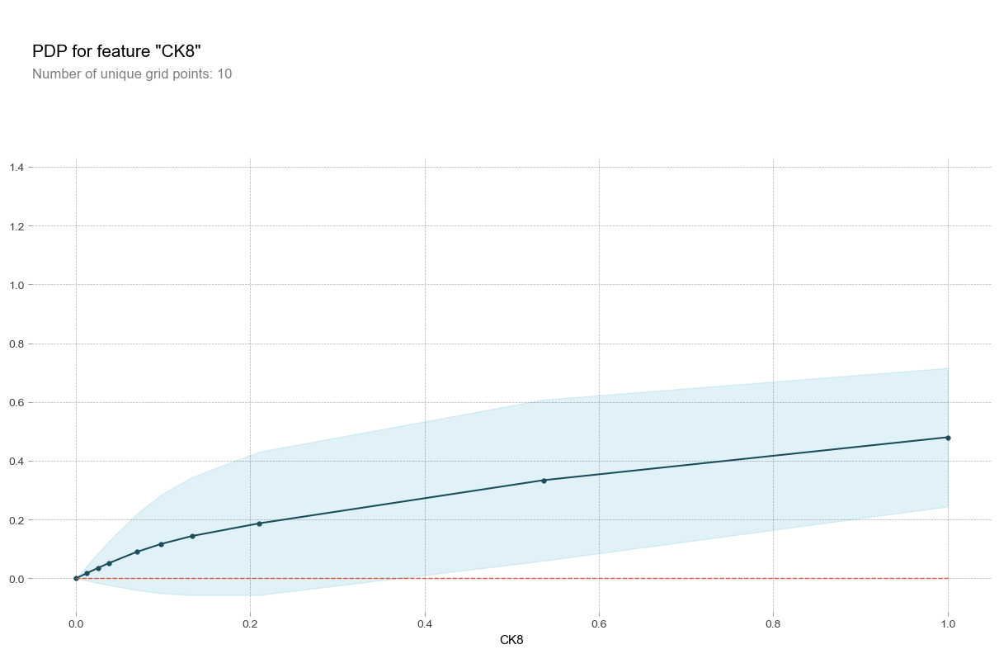

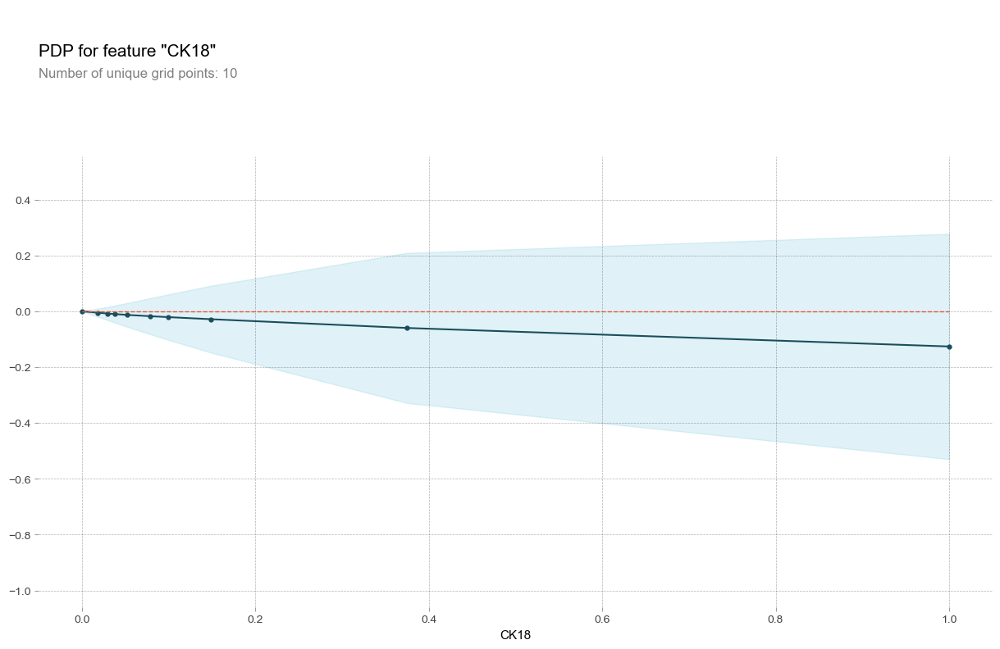

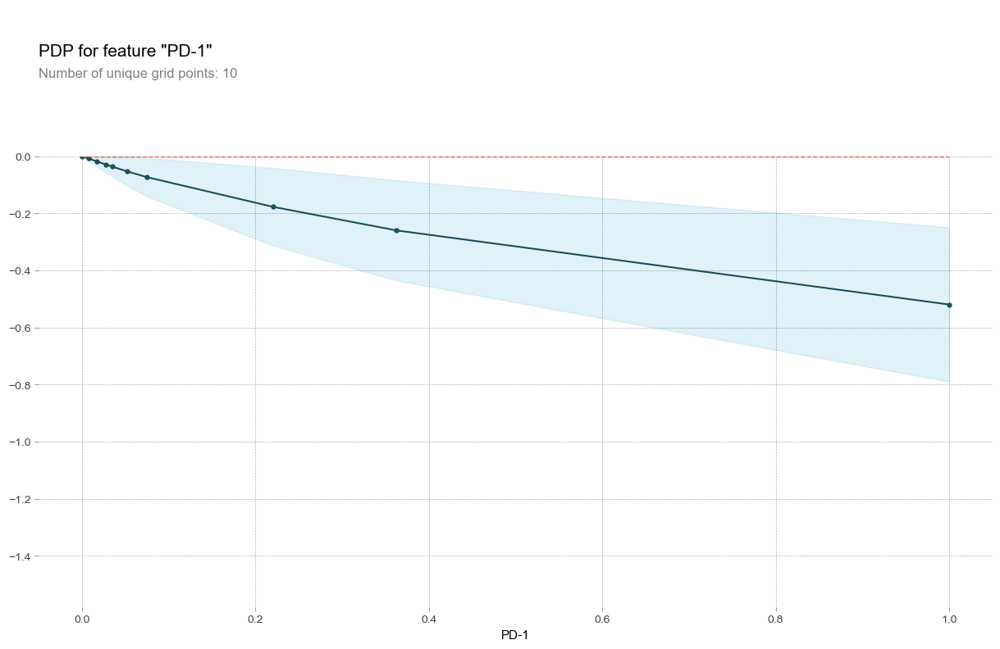

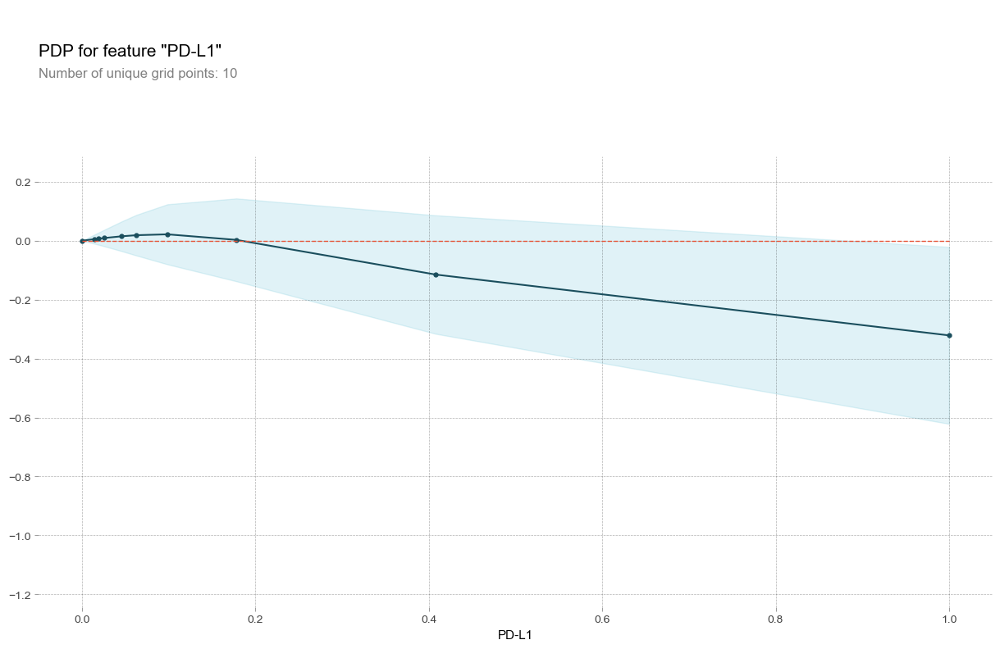

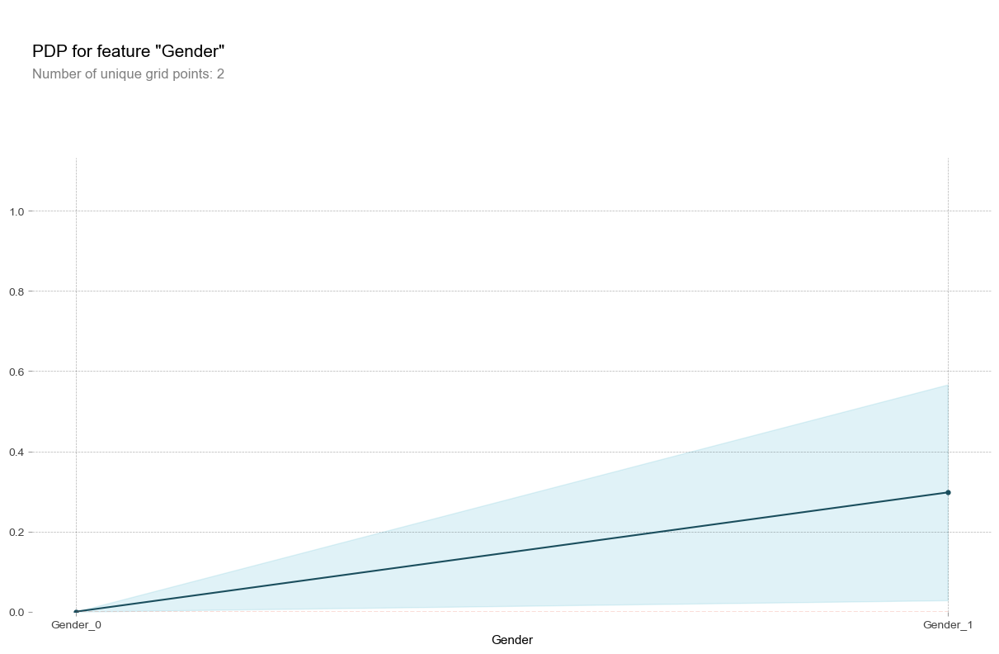

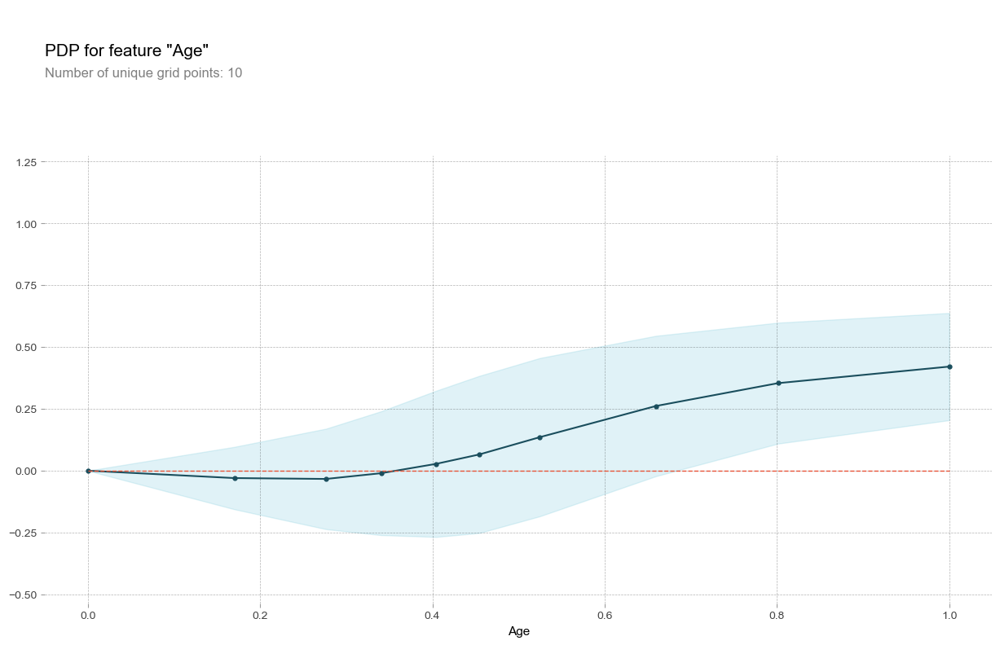

-----------------------------------------------------------------------------------------
X_nn2h 의 fold 3 에 대한 PDPplot


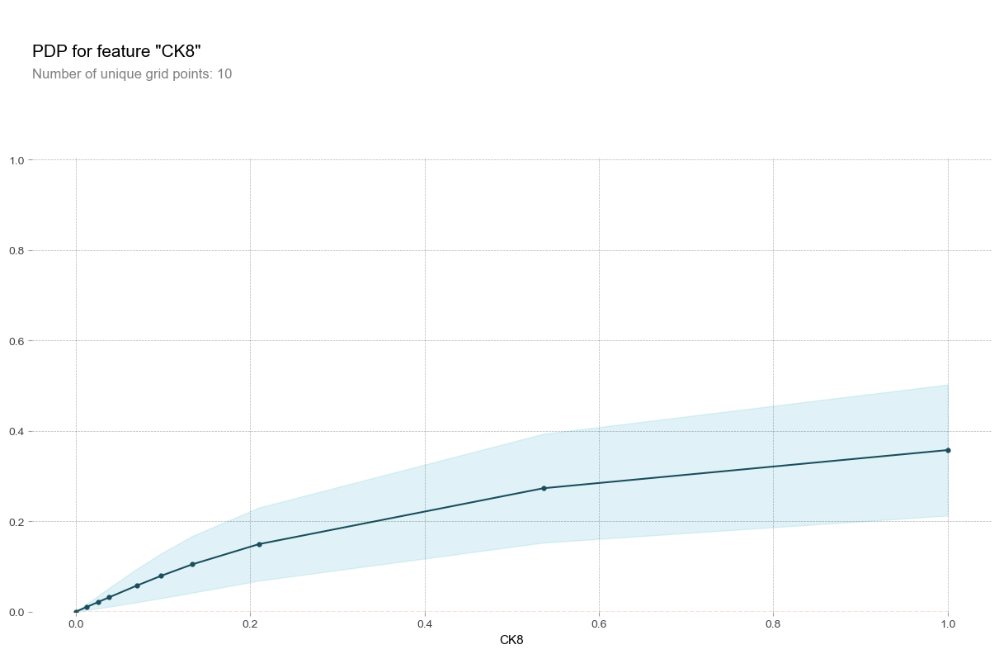

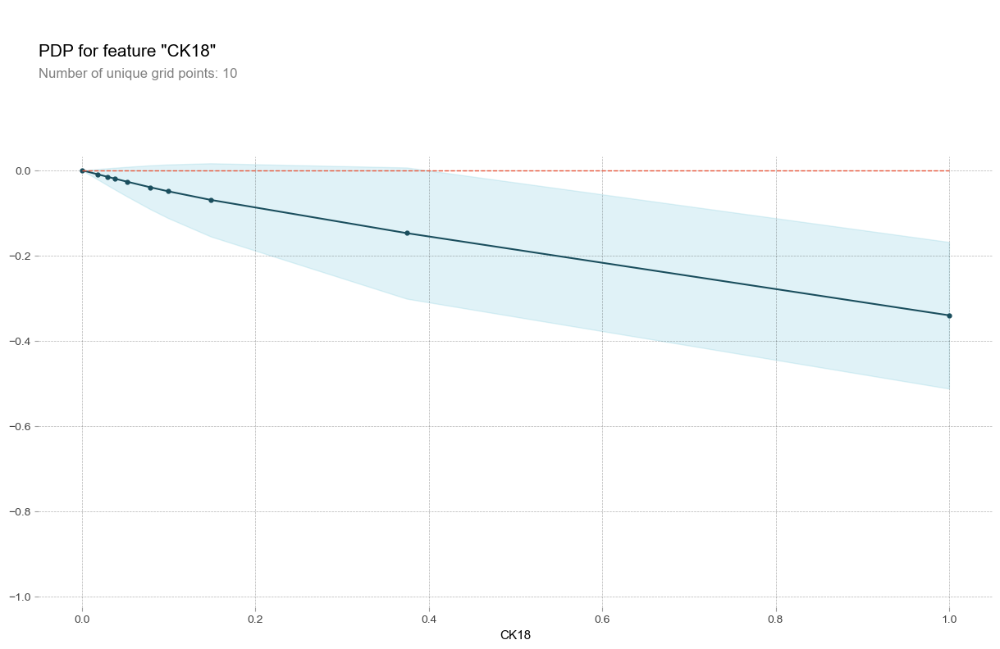

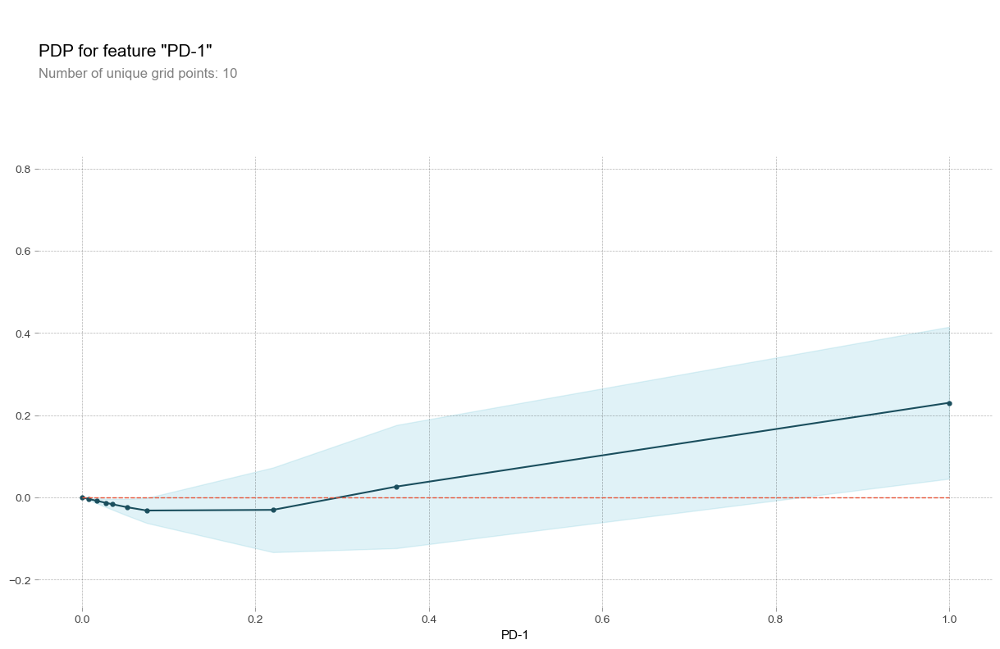

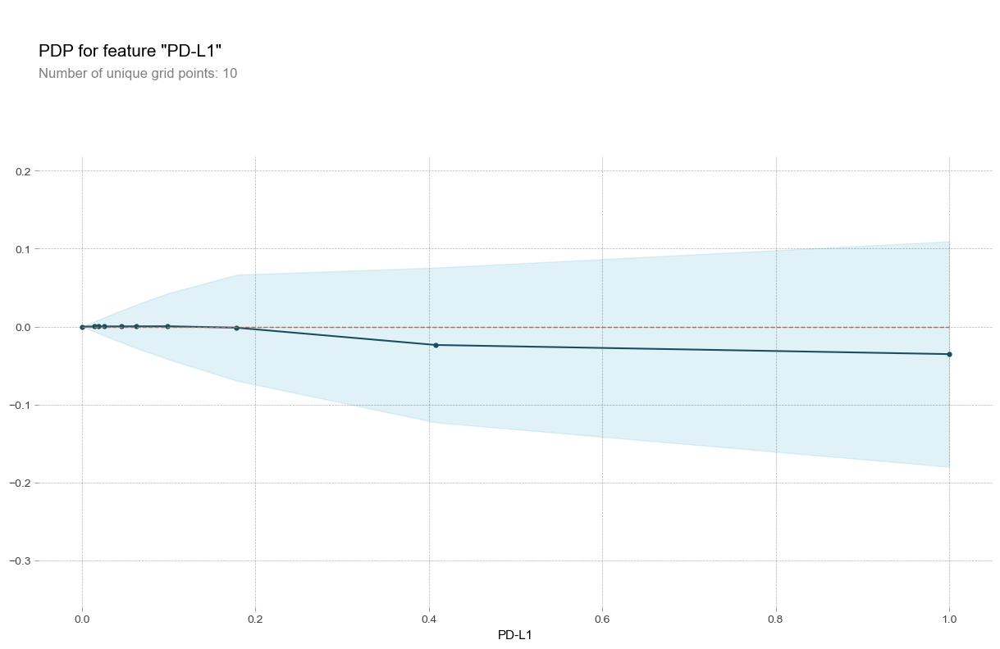

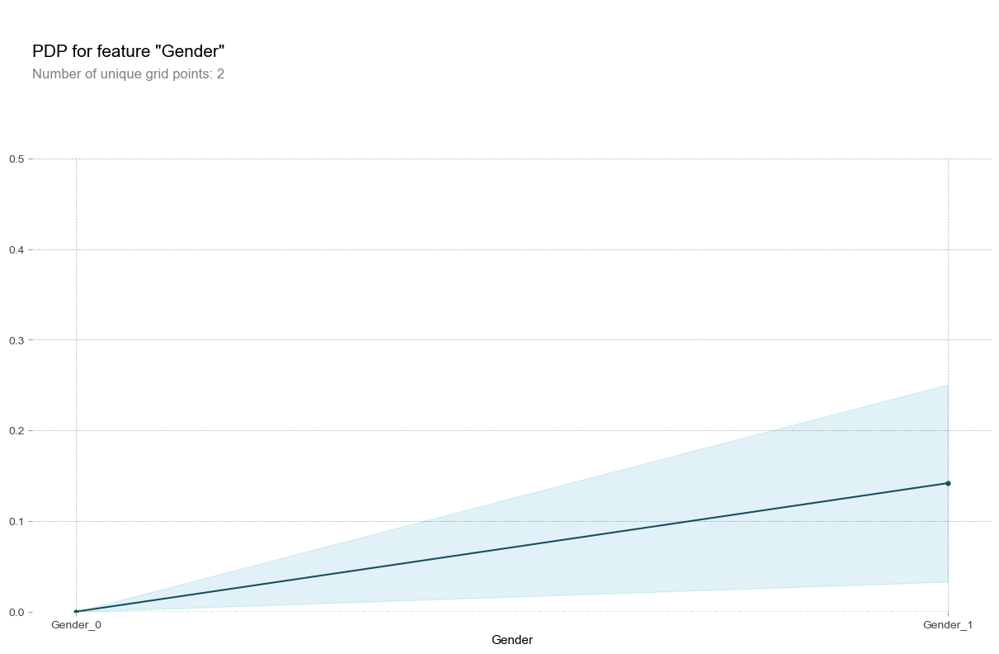

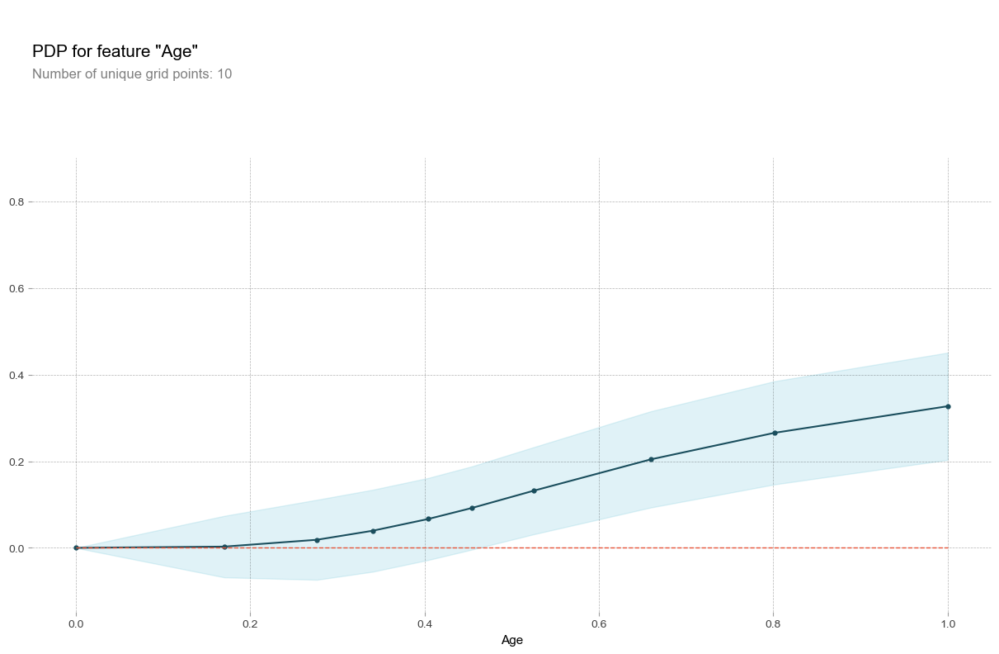

-----------------------------------------------------------------------------------------
X_nn2h 의 fold 4 에 대한 PDPplot


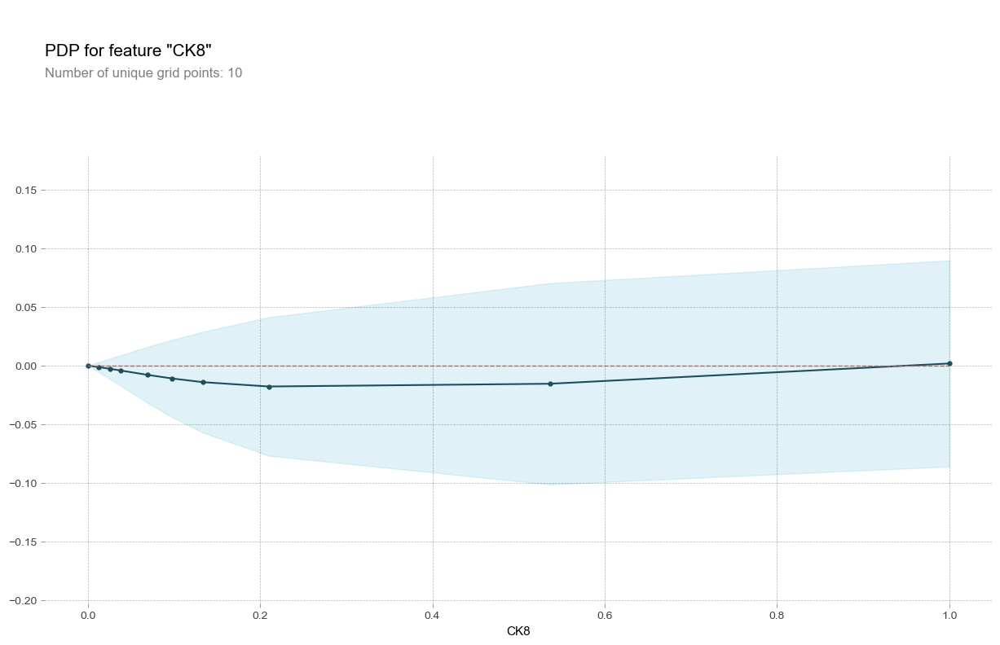

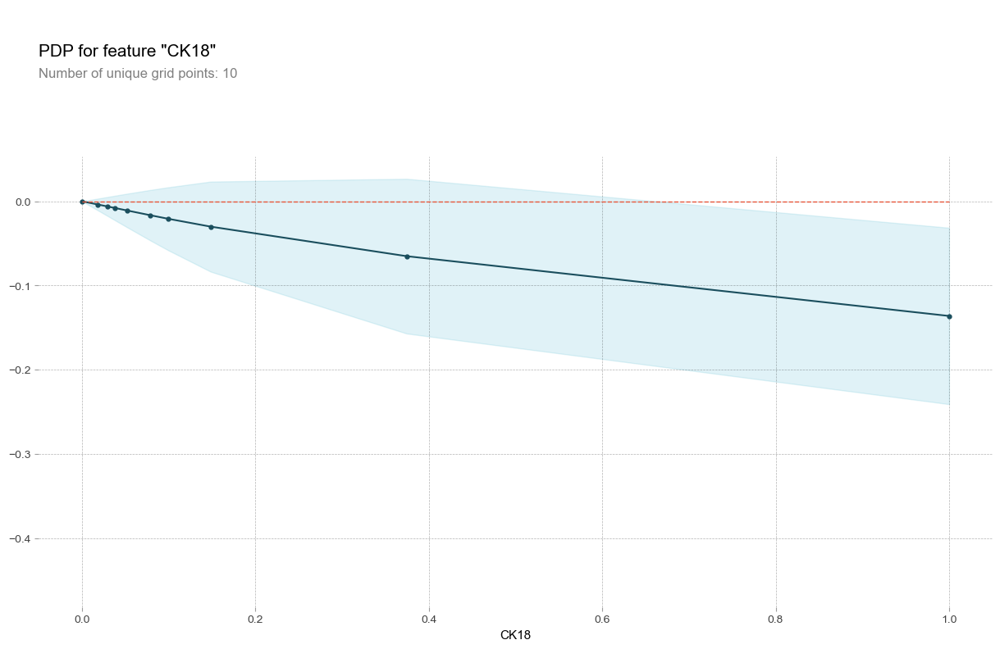

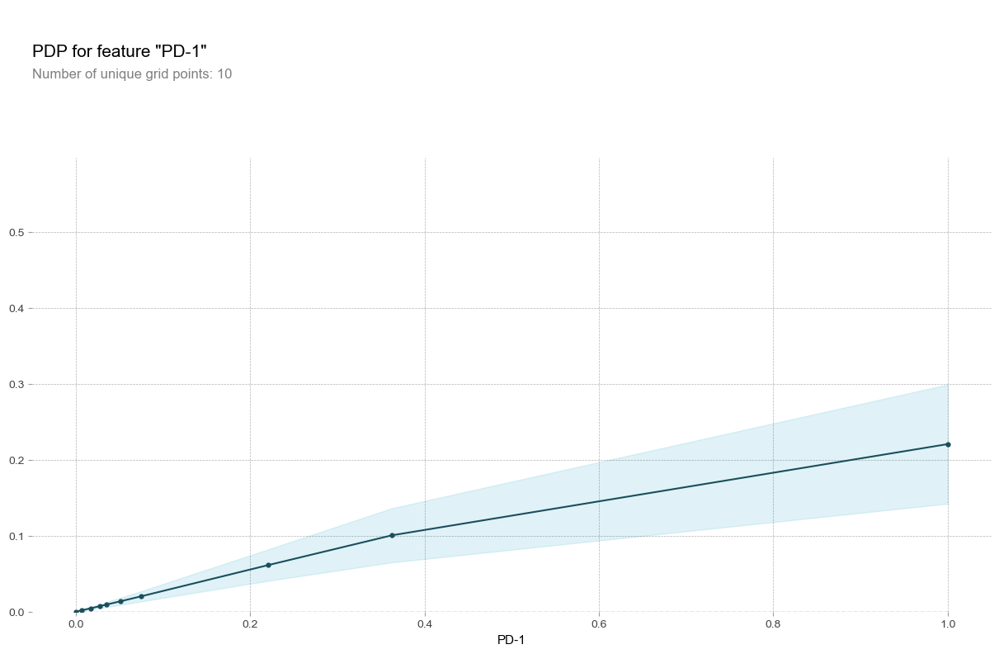

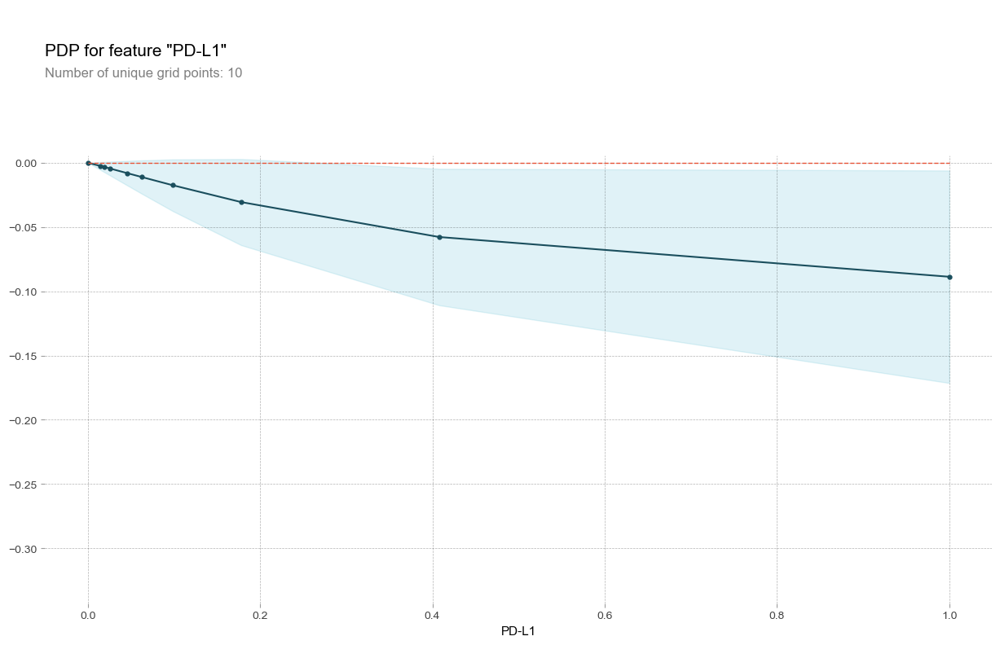

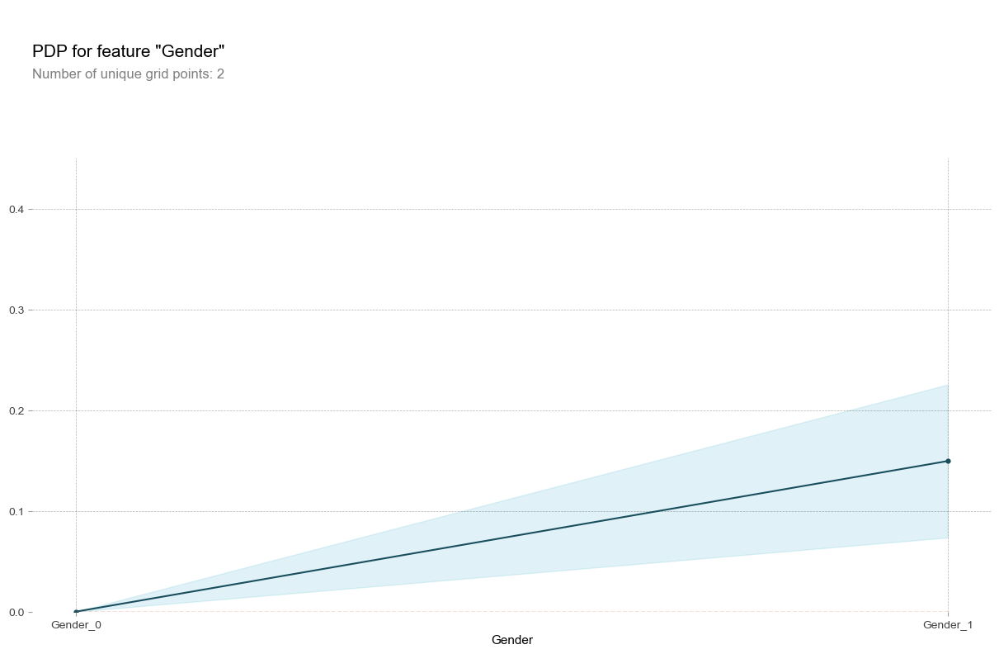

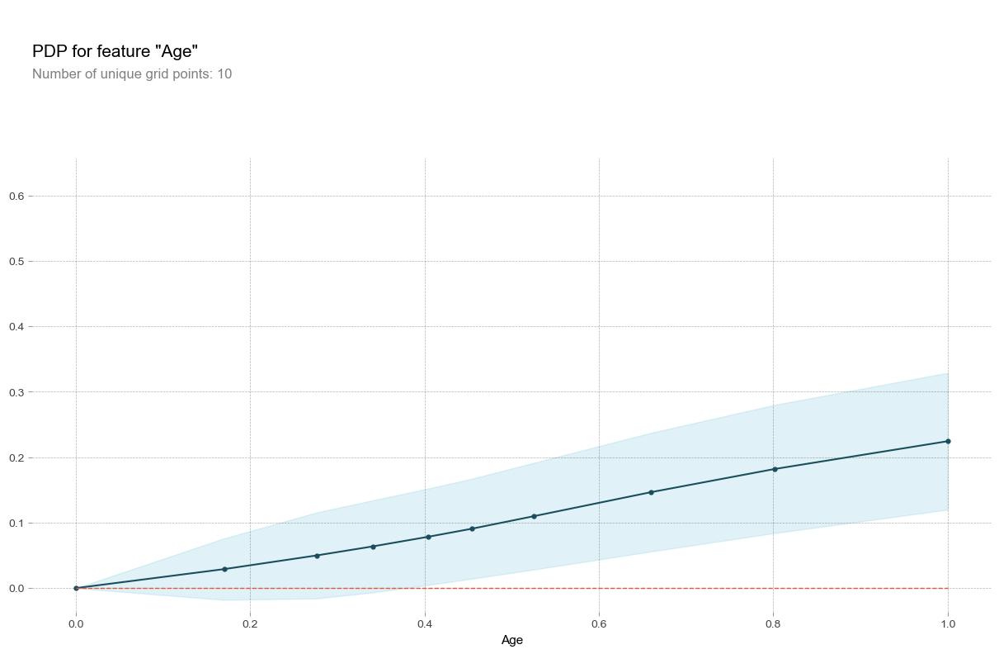

-----------------------------------------------------------------------------------------
X_nn2h 의 fold 5 에 대한 PDPplot


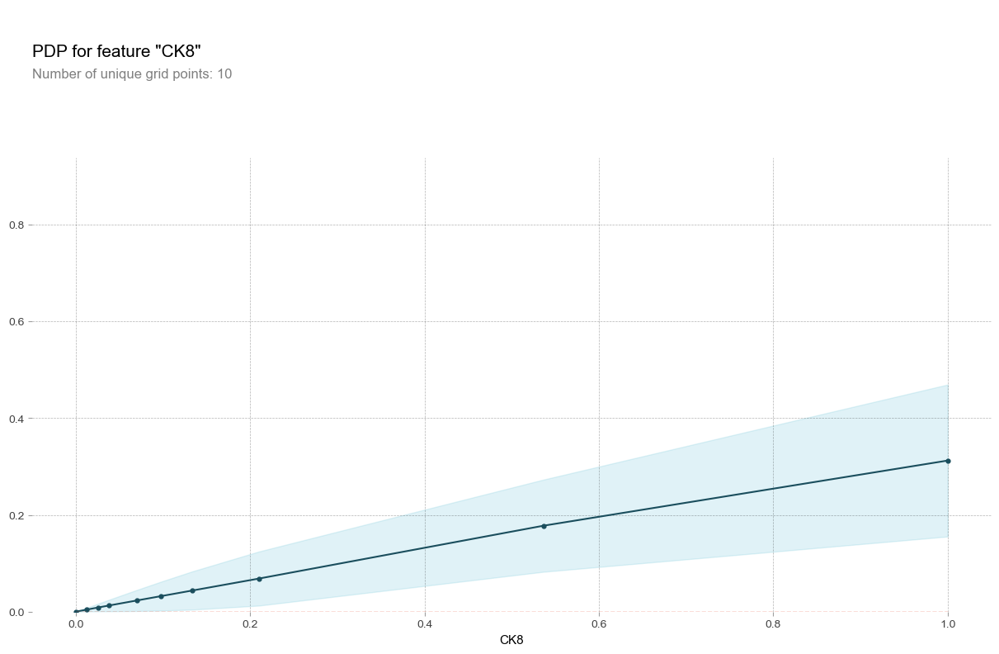

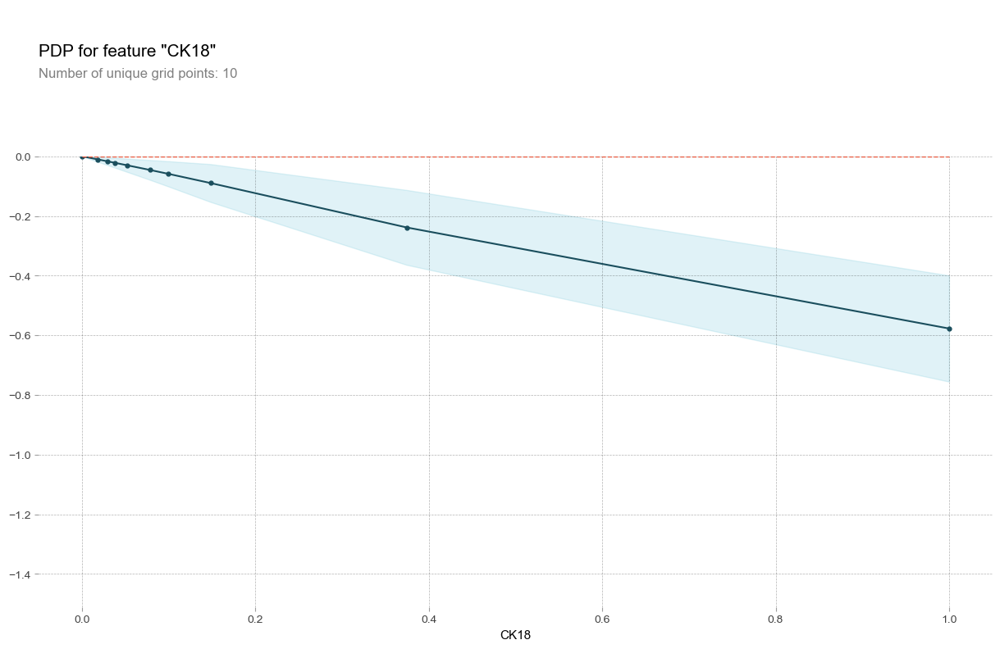

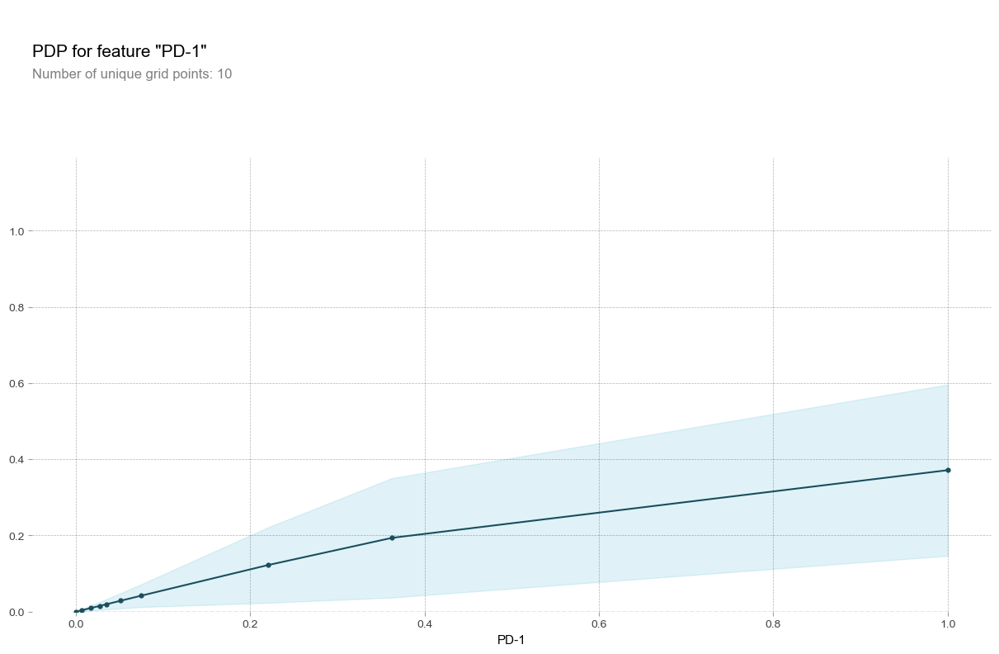

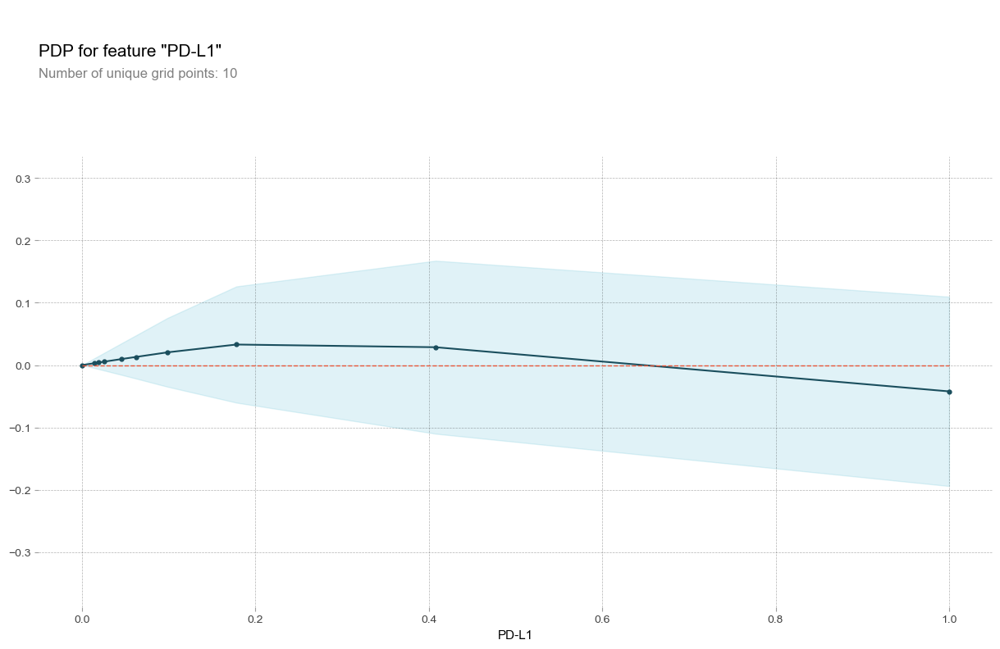

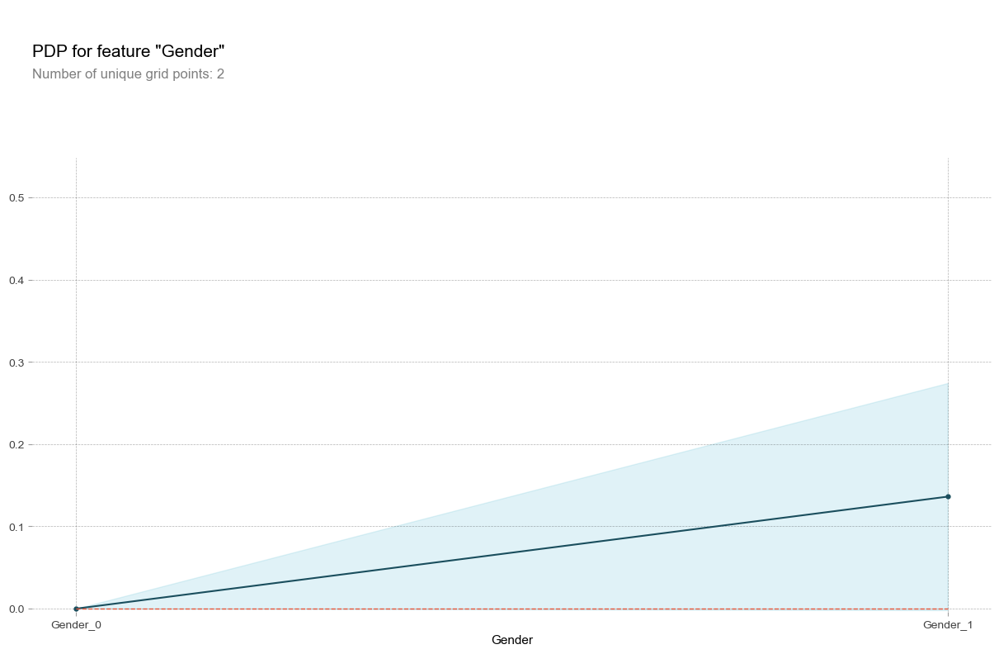

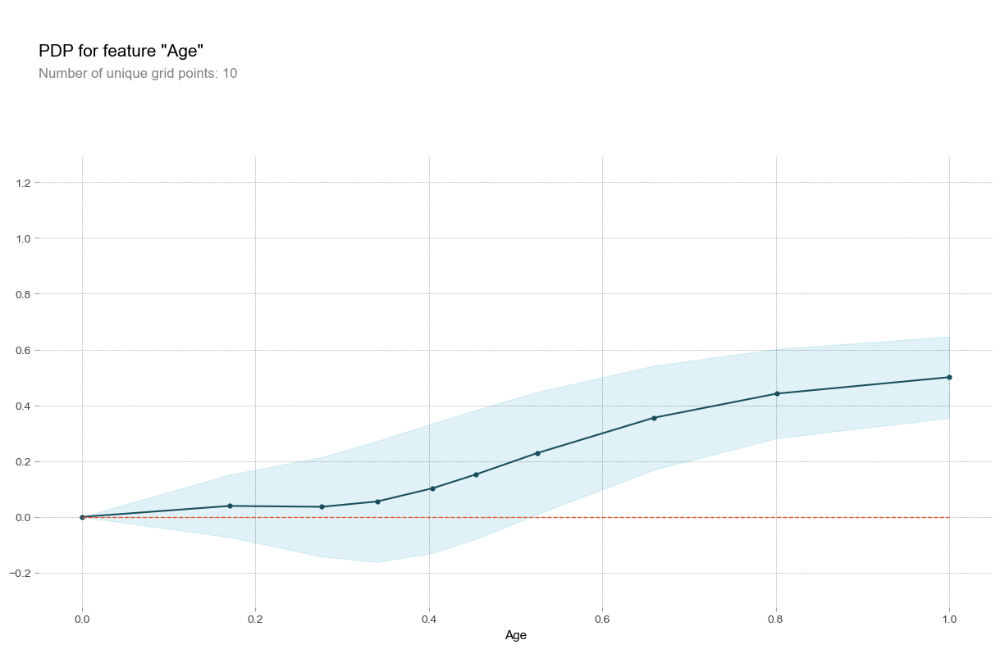

In [32]:
from pdpbox import pdp
import pandas as pd

for i in range(num_sets):
    model = Sequential()
    model.add(Dense(1024, input_dim=X_norm_sets[i].shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
    model.add(BatchNormalization())
    model.add(Dense(64,activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    
    print('-----------------------------------------------------------------------------------------')
    print(X_dataset_names[i],'에 대한 PDPplot')
    
    for j in range(5):
        model.load_weights(f"./nn2h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5")
        print('-----------------------------------------------------------------------------------------')
        print(X_dataset_names[i],'의 fold',j+1,'에 대한 PDPplot')
        
        for k in range(len(col_name_sets[i])):
            pdp_goals = pdp.pdp_isolate(model=model, dataset=X_norm_sets[i], 
                                        model_features=X_norm_sets[i].columns.tolist(),feature=col_name_sets[i][k])
        
            # Create a DataFrame from the data stored in the pdp_goals object
            df_pdp = pd.DataFrame({'feature_values': pdp_goals.feature_grids, 'partial_dependence': pdp_goals.pdp})

            # To save it as csv file:
            df_pdp.to_csv(f'./nn2h_pdp/{X_dataset_names[i]}_fold{j+1}_{col_name_sets[i][k]}.csv', index=False)

            # PDP 그리기
            pdp.pdp_plot(pdp_goals, col_name_sets[i][k])
            plt.show()
